# In this notebook I will look at the full Bdot measurements of the 25cm plane.

I will also check if taking the curl of the magnetic field recovers a current centered at the center of the circulation in the b field.  I will test schemes for locating the current centroid.

## Imports

In [1]:
import numpy as np
import scipy.optimize as opti
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
sns.set_context('poster')

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.tri import Triangulation, LinearTriInterpolator
from scipy.optimize import curve_fit
from scipy import odr
from scipy.optimize import leastsq
from skimage.feature import peak_local_max
import scipy.ndimage as ndimage
import cPickle as pickle
from scipy.integrate import odeint

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
import sys
sys.path.append('/Users/vonderlinden2/rsx_analysis/writing_to_vtk/source')
import structured_3d_vtk as struc_3d

## Define convience function and load magnetic field data.

In [4]:
def read_and_return_vector_and_grid(file_path, quantity_name, grid_name):
    r"""
    """
    array_dict = np.load(file_path)
    quantity = array_dict[quantity_name]
    grid = array_dict[grid_name]
    return quantity, grid

In [16]:
file_path = '../output/2016-07-03/B_z0249_'
ending = '.npz' 
b_fields = []
for time_point in xrange(21):
    name = file_path + str(time_point).zfill(4) + ending
    b_field, grid = read_and_return_vector_and_grid(name, 'b', 'grid')
    b_fields.append(b_field)

# Plot magnetic field and magntiude

There is a clearly visible field line null at each time step. (It leaves the measurement domain in some timesteps.) This may be an interesting center point from which to launch flux tubes.
Does the field line null correspond to the current centroid? What about temperature and density?

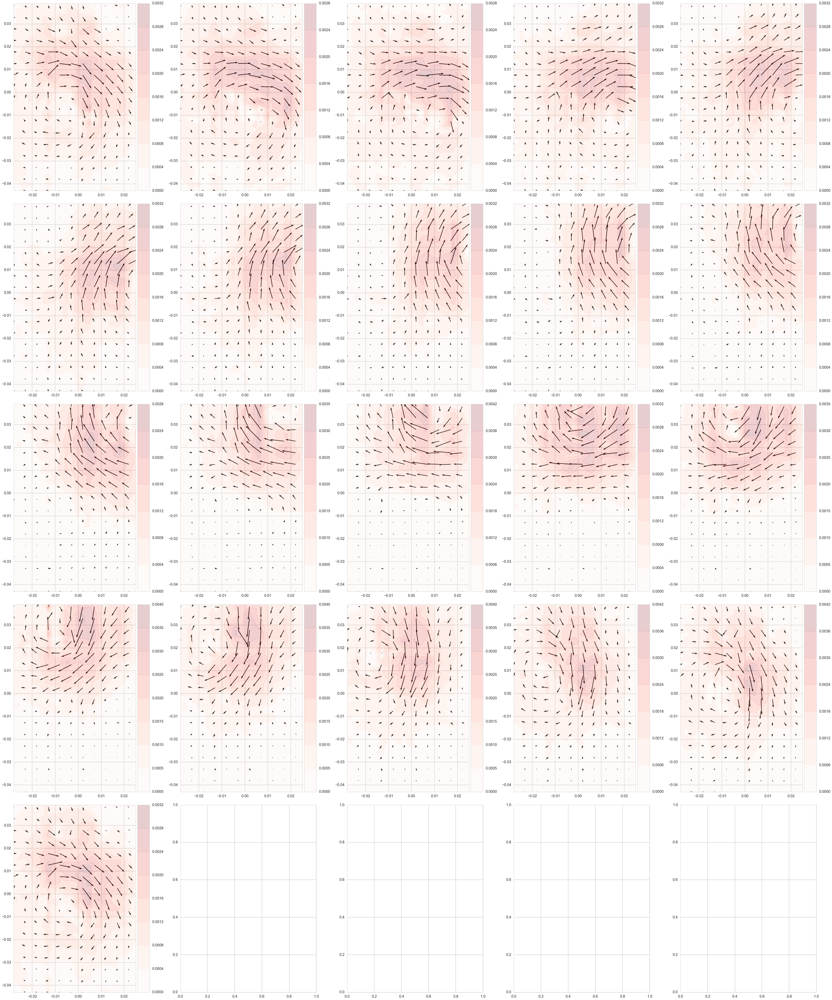

In [17]:
figure, axes = plt.subplots(5, 5, figsize=(50, 60))
for i in xrange(21):
    axes[i/5][i%5].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
                          b_fields[i][0, :, :][::5, ::5], b_fields[i][1, :, :][::5, ::5])
    contour = axes[i/5][i%5].contourf(grid[0, :, :], grid[1, :, :], 
                                      np.sqrt(b_fields[i][0, :, :]**2 + b_fields[i][1, :, :]**2), 
                                      alpha=0.2, cmap='Reds')
    divider = make_axes_locatable(axes[i/5][i%5])
    colorbar_axis = divider.append_axes("right", size="10%", pad=0.1)
    colorbar = plt.colorbar(contour, cax=colorbar_axis)
plt.tight_layout()

# Three methods for calculating the derivatives for the curl
1. 1st order difference of interpolated data with np.diff
2. 2nd order difference of interpolated data with np.gradient
3. 2nd order difference of triangulated measurements with matplotlib tri

In [18]:
grid[0][5:-5:5, 5:-5:5]

array([[-0.023, -0.023, -0.023, -0.023, -0.023, -0.023, -0.023, -0.023,
        -0.023, -0.023, -0.023, -0.023, -0.023, -0.023, -0.023],
       [-0.018, -0.018, -0.018, -0.018, -0.018, -0.018, -0.018, -0.018,
        -0.018, -0.018, -0.018, -0.018, -0.018, -0.018, -0.018],
       [-0.013, -0.013, -0.013, -0.013, -0.013, -0.013, -0.013, -0.013,
        -0.013, -0.013, -0.013, -0.013, -0.013, -0.013, -0.013],
       [-0.008, -0.008, -0.008, -0.008, -0.008, -0.008, -0.008, -0.008,
        -0.008, -0.008, -0.008, -0.008, -0.008, -0.008, -0.008],
       [-0.003, -0.003, -0.003, -0.003, -0.003, -0.003, -0.003, -0.003,
        -0.003, -0.003, -0.003, -0.003, -0.003, -0.003, -0.003],
       [ 0.002,  0.002,  0.002,  0.002,  0.002,  0.002,  0.002,  0.002,
         0.002,  0.002,  0.002,  0.002,  0.002,  0.002,  0.002],
       [ 0.007,  0.007,  0.007,  0.007,  0.007,  0.007,  0.007,  0.007,
         0.007,  0.007,  0.007,  0.007,  0.007,  0.007,  0.007],
       [ 0.012,  0.012,  0.012,  0.012,  

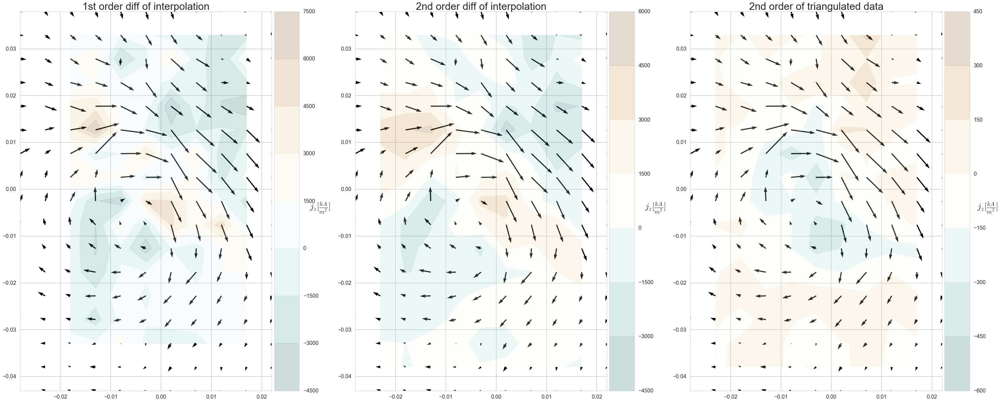

In [19]:
figure, axes = plt.subplots(1, 3, figsize=((50, 20)))

## 1st order difference of interpolated data
axes[0].set_title('1st order diff of interpolation', fontsize=30)
j_z = (np.diff(b_fields[1][0, :, :][5:-5:5, 5:-5:5], axis=0)[:,1:]*5e3 - np.diff(b_fields[0][1, :, :][5:-5:5, 5:-5:5], axis=1)[1:,:]*5e3)/(1.26e-6)/1e3
axes[0].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
contour = axes[0].contourf(grid[0, :, :][10:-5:5, 10:-5:5], grid[1, :, :][10:-5:5, 10:-5:5], 
                           j_z, alpha=0.2, cmap='BrBG_r')
divider = make_axes_locatable(axes[0])
colorbar_axis = divider.append_axes("right", size="10%", pad=0.1)
colorbar = plt.colorbar(contour, cax=colorbar_axis)
colorbar.set_label(r'$j_z [\frac{kA}{m^2}]$', fontsize=25, rotation='horizontal')

## 2nd order difference of interpolated data
axes[1].set_title('2nd order diff of interpolation', fontsize=30)
j_z = (np.gradient(b_fields[1][0, :, :][5:-5:5, 5:-5:5])[0]*5e3 - np.gradient(b_fields[0][1, :, :][5:-5:5, 5:-5:5])[1]*5e3)/(1.26e-6)/1e3
axes[1].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
contour = axes[1].contourf(grid[0, :, :][5:-5:5, 5:-5:5], grid[1, :, :][5:-5:5, 5:-5:5], 
                           j_z, alpha=0.2, cmap='BrBG_r')
divider = make_axes_locatable(axes[1])
colorbar_axis = divider.append_axes("right", size="10%", pad=0.1)
colorbar = plt.colorbar(contour, cax=colorbar_axis)
colorbar.set_label(r'$j_z [\frac{kA}{m^2}]$', fontsize=25, rotation='horizontal')


## 2nd order difference of triangulated data
axes[2].set_title('2nd order of triangulated data', fontsize=30)
spatial_increment = 0.001
x_min, x_max = -0.027, 0.022
y_min, y_max = -0.021, 0.0295 
mesh = np.meshgrid(np.linspace(x_min, x_max, np.ceil((x_max-x_min)/spatial_increment)), 
                   np.linspace(y_min, y_max, np.ceil((y_max-y_min)/spatial_increment)))

bx_measurements = struc_3d.read_idl('bx')
by_measurements = struc_3d.read_idl('by')

for plane in [0.249, 0.302, 0.357, 0.416]:
    bx_measurements[plane] = struc_3d.average_duplicate_points(bx_measurements[plane])
    by_measurements[plane] = struc_3d.average_duplicate_points(by_measurements[plane])
    
triangulation_bx = Triangulation(bx_measurements[0.249]['x_out'], bx_measurements[0.249]['y_out'])
interpolation_bx = LinearTriInterpolator(triangulation_bx, bx_measurements[0.249]['a_out'][0][:, 0])
triangulation_by = Triangulation(by_measurements[0.249]['x_out'], by_measurements[0.249]['y_out'])
interpolation_by = LinearTriInterpolator(triangulation_by, by_measurements[0.249]['a_out'][0][:, 0])
    
j_z = (np.asarray(interpolation_by.gradient(grid[0][5:-5:5, 5:-5:5], grid[1][5:-5:5, 5:-5:5]))[0] - 
       np.asarray(interpolation_bx.gradient(grid[0][5:-5:5, 5:-5:5], grid[1][5:-5:5, 5:-5:5]))[1])/(1.26e-6)/1e3

axes[2].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
contour = axes[2].contourf(grid[0, :, :][5:-5:5, 5:-5:5], grid[1, :, :][5:-5:5, 5:-5:5], 
                           j_z, alpha=0.2, cmap='BrBG_r')

divider = make_axes_locatable(axes[2])
colorbar_axis = divider.append_axes("right", size="10%", pad=0.1)
colorbar = plt.colorbar(contour, cax=colorbar_axis)
colorbar.set_label(r'$j_z [\frac{kA}{m^2}]$', fontsize=25, rotation='horizontal')

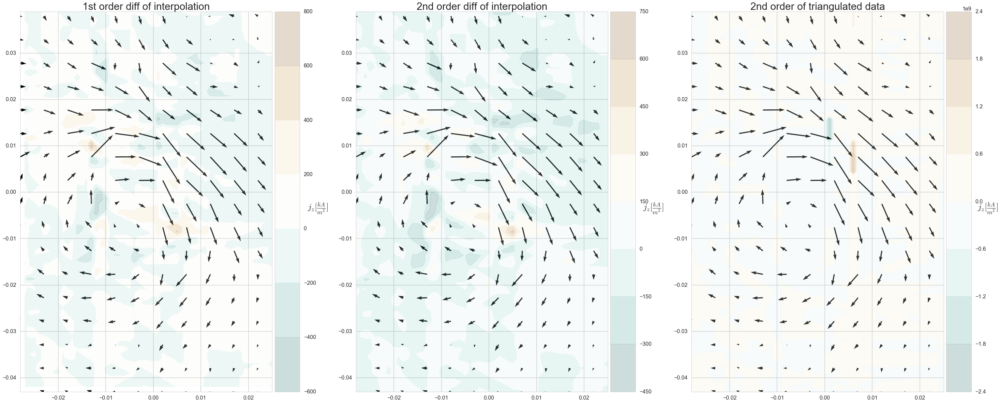

In [22]:
figure, axes = plt.subplots(1, 3, figsize=((50, 20)))

## 1st order difference of interpolated data
axes[0].set_title('1st order diff of interpolation', fontsize=30)
j_z = (np.diff(b_fields[1][0, :, :], axis=0)[:,1:]*1e3 - np.diff(b_fields[0][1, :, :], axis=1)[1:,:]*1e3)/(1.26e-6)/1e3
axes[0].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
contour = axes[0].contourf(grid[0, :, :][1:, 1:], grid[1, :, :][1:, 1:], 
                           j_z, alpha=0.2, cmap='BrBG_r')
divider = make_axes_locatable(axes[0])
colorbar_axis = divider.append_axes("right", size="10%", pad=0.1)
colorbar = plt.colorbar(contour, cax=colorbar_axis)
colorbar.set_label(r'$j_z [\frac{kA}{m^2}]$', fontsize=25, rotation='horizontal')

## 2nd order difference of interpolated data
axes[1].set_title('2nd order diff of interpolation', fontsize=30)
j_z = (np.gradient(b_fields[1][0, :, :])[0]*1e3 - np.gradient(b_fields[0][1, :, :])[1]*1e3)/(1.26e-6)/1e3
axes[1].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
contour = axes[1].contourf(grid[0, :, :], grid[1, :, :], 
                           j_z, alpha=0.2, cmap='BrBG_r')
divider = make_axes_locatable(axes[1])
colorbar_axis = divider.append_axes("right", size="10%", pad=0.1)
colorbar = plt.colorbar(contour, cax=colorbar_axis)
colorbar.set_label(r'$j_z [\frac{kA}{m^2}]$', fontsize=25, rotation='horizontal')


## 2nd order difference of triangulated data
axes[2].set_title('2nd order of triangulated data', fontsize=30)
spatial_increment = 0.001
x_min, x_max = -0.027, 0.022
y_min, y_max = -0.021, 0.0295 
mesh = np.meshgrid(np.linspace(x_min, x_max, np.ceil((x_max-x_min)/spatial_increment)), 
                   np.linspace(y_min, y_max, np.ceil((y_max-y_min)/spatial_increment)))

bx_measurements = struc_3d.read_idl('bx')
by_measurements = struc_3d.read_idl('by')

for plane in [0.249, 0.302, 0.357, 0.416]:
    bx_measurements[plane] = struc_3d.average_duplicate_points(bx_measurements[plane])
    by_measurements[plane] = struc_3d.average_duplicate_points(by_measurements[plane])
    
triangulation_bx = Triangulation(bx_measurements[0.249]['x_out'], bx_measurements[0.249]['y_out'])
interpolation_bx = LinearTriInterpolator(triangulation_bx, bx_measurements[0.249]['a_out'][0][:, 0])
triangulation_by = Triangulation(by_measurements[0.249]['x_out'], by_measurements[0.249]['y_out'])
interpolation_by = LinearTriInterpolator(triangulation_by, by_measurements[0.249]['a_out'][0][:, 0])
    
j_z = (np.asarray(interpolation_by.gradient(grid[0], grid[1]))[0] - 
       np.asarray(interpolation_bx.gradient(grid[0], grid[1]))[1])/(1.26e-6)/1e3

axes[2].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
contour = axes[2].contourf(grid[0, :, :], grid[1, :, :], 
                           j_z, alpha=0.2, cmap='BrBG_r')

divider = make_axes_locatable(axes[2])
colorbar_axis = divider.append_axes("right", size="10%", pad=0.1)
colorbar = plt.colorbar(contour, cax=colorbar_axis)
colorbar.set_label(r'$j_z [\frac{kA}{m^2}]$', fontsize=25, rotation='horizontal')

Only the differences taken from the triagnulated measurements seem to be physical, there is a negative current close to the center of circulation of the magnetic vector field and a postive current in the upper right corner which acts to increase the magnetic field magnitude there.
The max current is close to the $500 kA/m^2 = 50 A/cm^2$ quoted in Jason's paper.

# Axial current for 21 time steps in a rotation

The field line null is close to the negative current but not always at its center or peak.

In [8]:
spatial_increment = 0.001
x_min, x_max = -0.027, 0.022
y_min, y_max = -0.021, 0.0295 
mesh = np.meshgrid(np.linspace(x_min, x_max, np.ceil((x_max-x_min)/spatial_increment)), 
                   np.linspace(y_min, y_max, np.ceil((y_max-y_min)/spatial_increment)))

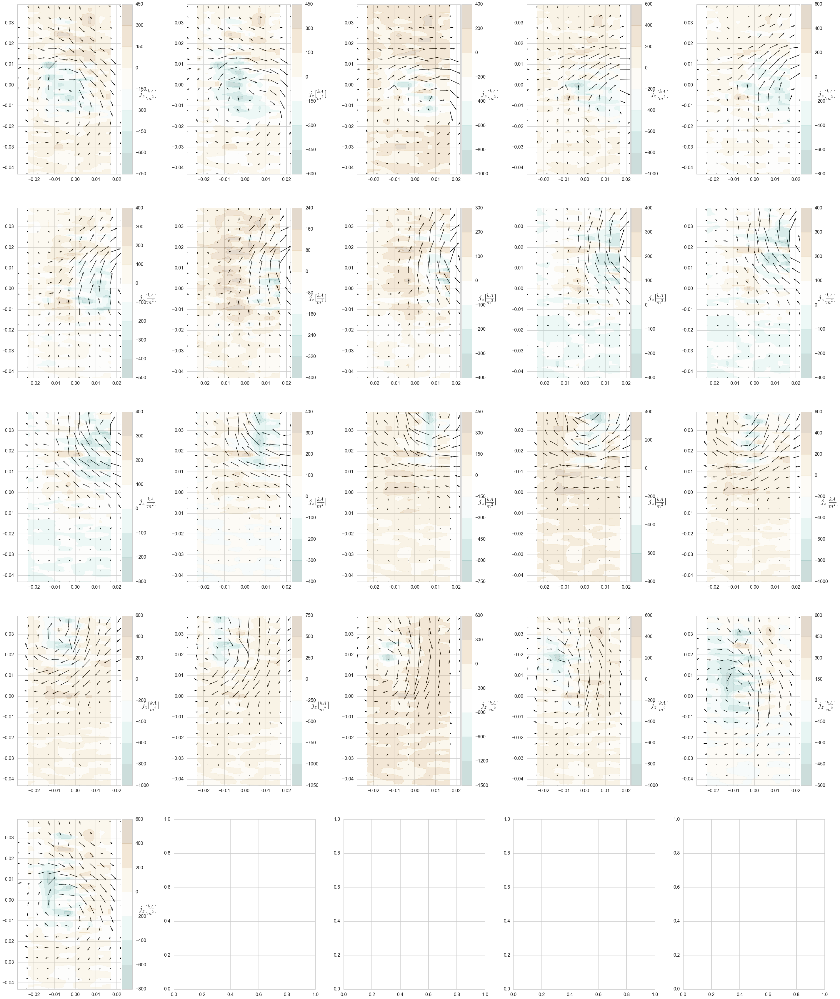

In [9]:
bx_measurements = struc_3d.read_idl('bx')
by_measurements = struc_3d.read_idl('by')

for plane in [0.249, 0.302, 0.357, 0.416]:
    bx_measurements[plane] = struc_3d.average_duplicate_points(bx_measurements[plane])
    by_measurements[plane] = struc_3d.average_duplicate_points(by_measurements[plane])
    
figure, axes = plt.subplots(5, 5, figsize=(50, 60))

currents = []

for time_point in xrange(21):     
    triangulation_bx = Triangulation(bx_measurements[0.249]['x_out'], bx_measurements[0.249]['y_out'])
    interpolation_bx = LinearTriInterpolator(triangulation_bx, bx_measurements[0.249]['a_out'][i][:, 0])
    triangulation_by = Triangulation(by_measurements[0.249]['x_out'], by_measurements[0.249]['y_out'])
    interpolation_by = LinearTriInterpolator(triangulation_by, by_measurements[0.249]['a_out'][i][:, 0])
    
    j_z = (np.asarray(interpolation_by.gradient(grid[0][5:-5:5], grid[1][5:-5:5]))[0] - 
           np.asarray(interpolation_bx.gradient(grid[0][5:-5:5], grid[1][5:-5:5]))[1])/(1.26e-6)/1e3
    
    currents.append(j_z)
    
    i = time_point
    axes[i/5][i%5].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
                          b_fields[i][0, :, :][::5, ::5], b_fields[i][1, :, :][::5, ::5])
    contour = axes[i/5][i%5].contourf(grid[0, :, :][5:-5:5], grid[1, :, :][5:-5:5], 
                                      j_z, alpha=0.2, cmap='BrBG_r')
    axes[i/5, i%5].set_aspect('equal')
    divider = make_axes_locatable(axes[i/5][i%5])
    colorbar_axis = divider.append_axes("right", size="10%", pad=0.05)
    colorbar = plt.colorbar(contour, cax=colorbar_axis)
    colorbar.set_label(r'$j_z [\frac{kA}{m^2}]$', fontsize=25, rotation='horizontal')
    

## Here I mark the peak negative current and peak positive current.

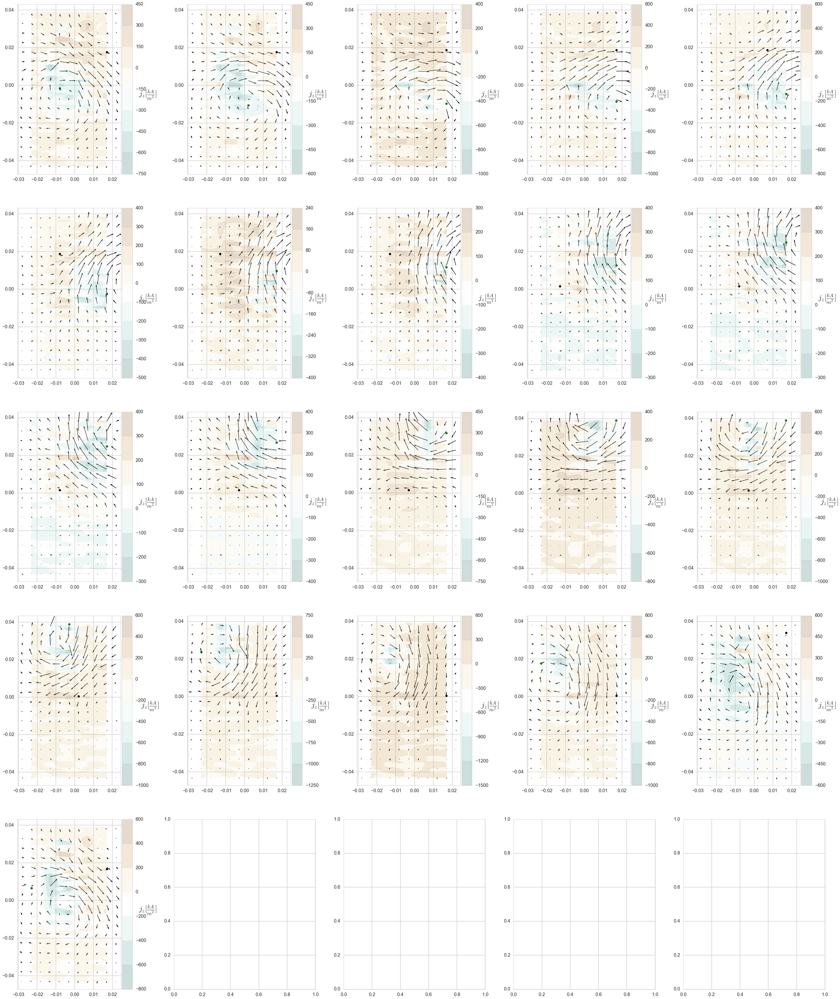

In [10]:
figure, axes = plt.subplots(5, 5, figsize=(50, 60))
for i, current in enumerate(currents):
    filtered_current = ndimage.gaussian_filter(current, 3)
    min_index = np.unravel_index(filtered_current.argmin(), 
                                 filtered_current.shape)
    max_index = np.unravel_index(filtered_current.argmax(), 
                                 filtered_current.shape)
    axes[i/5][i%5].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
                          b_fields[i][0, :, :][::5, ::5], b_fields[i][1, :, :][::5, ::5])
    contour = axes[i/5][i%5].contourf(grid[0, :, :][5:-5:5], grid[1, :, :][5:-5:5], 
                                      current, alpha=0.2, cmap='BrBG_r')
    divider = make_axes_locatable(axes[i/5][i%5])
    colorbar_axis = divider.append_axes("right", size="10%", pad=0.05)
    colorbar = plt.colorbar(contour, cax=colorbar_axis)
    colorbar.set_label(r'$j_z [\frac{kA}{m^2}]$', fontsize=25, rotation='horizontal')
    axes[i/5, i%5].scatter(grid[0][5:-5:5][min_index], grid[1][5:-5:5][min_index], c='g', s=50)
    axes[i/5, i%5].scatter(grid[0][5:-5:5][max_index], grid[1][5:-5:5][max_index], c='black', s=50)
    axes[i/5, i%5].set_aspect('equal')
    

# Approahces to fitting the field line null.

## Method 1: Determine local peaks and fit a circle to them.

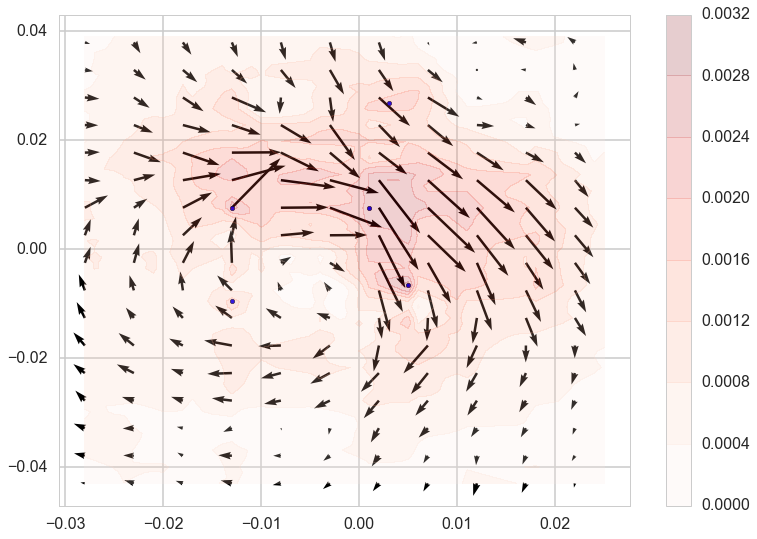

In [11]:
magnitude = np.sqrt(b_fields[0][0, :, :]**2 + b_fields[0][1, :, :]**2)
peak_index = peak_local_max(magnitude, min_distance=7)
plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
plt.scatter(grid[0, peak_index[:, 0], peak_index[:, 1]], 
            grid[1, peak_index[:, 0], peak_index[:, 1]])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()

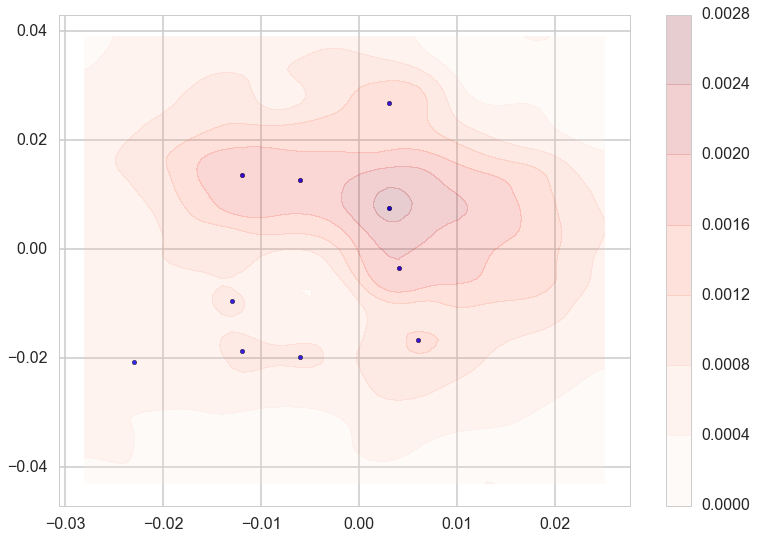

In [12]:
filtered_magnitude = ndimage.gaussian_filter(magnitude, 2)
filtered_peak_index = peak_local_max(filtered_magnitude, threshold_abs=0.0006)
#plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
#           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
plt.scatter(grid[0, filtered_peak_index[:, 0], filtered_peak_index[:, 1]], 
            grid[1, filtered_peak_index[:, 0], filtered_peak_index[:, 1]])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             filtered_magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()

## Harder case centroid off measurement plane

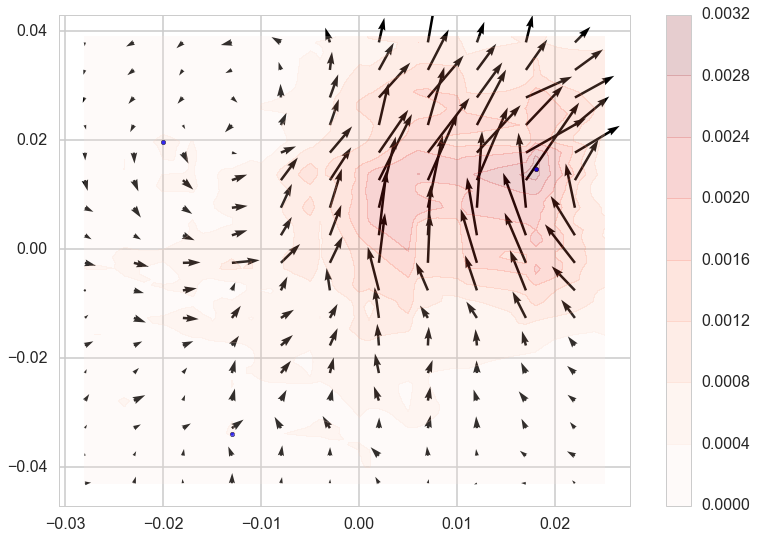

In [13]:
magnitude = np.sqrt(b_fields[6][0, :, :]**2 + b_fields[6][1, :, :]**2)
peak_index = peak_local_max(magnitude, min_distance=7)
plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[6][0, :, :][::5, ::5], b_fields[6][1, :, :][::5, ::5])
plt.scatter(grid[0, peak_index[:, 0], peak_index[:, 1]], 
            grid[1, peak_index[:, 0], peak_index[:, 1]])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()

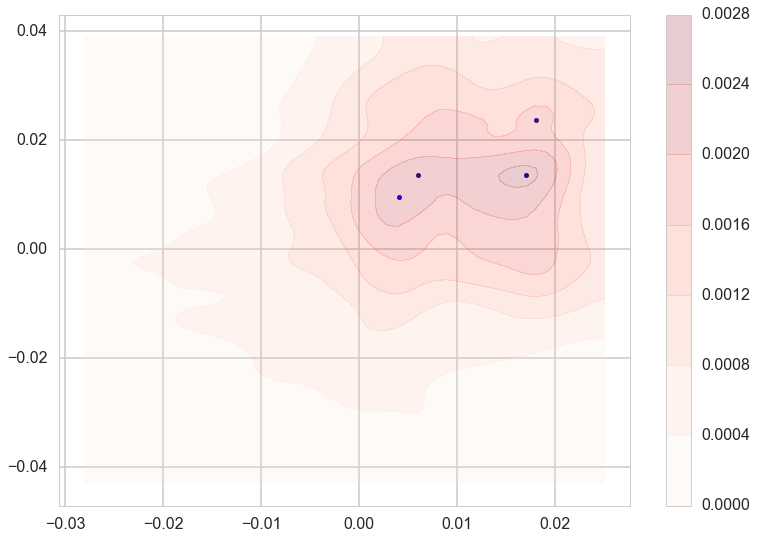

In [14]:
filtered_magnitude = ndimage.gaussian_filter(magnitude, 2)
filtered_peak_index = peak_local_max(filtered_magnitude, threshold_abs=0.0006)
#plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
#           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
plt.scatter(grid[0, filtered_peak_index[:, 0], filtered_peak_index[:, 1]], 
            grid[1, filtered_peak_index[:, 0], filtered_peak_index[:, 1]])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             filtered_magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()

# Method 2: Integrate field lines off the max and fit circle to the field lines

## Try it out by hand

In [15]:
def to_min(params, points):
    a = 2.*params[0]
    b = 2.*params[1]
    c = params[2]**2 - params[1]**2 - params[0]**2
    return a*points[0] + b*points[1] + c - points[0]**2 - points[1]**2

def calculate_radius(x, y, x_0, y_0):
    r"""
    Calculate radius.
    """
    return (x - x_0)**2 + (y - y_0)**2


def estimate_radius(data, x_0, y_0):
    r"""
    Estimate radius from data.
    """
    return calculate_radius(data[:, 0], data[:, 1], x_0, y_0).mean()

params_guess = [0, 0, 0.01]

In [16]:
interpolator_x = pickle.load(open('../output/2016-07-03/B_z0249_x_0000.p', 'rb'))
interpolator_y = pickle.load(open('../output/2016-07-03/B_z0249_y_0000.p', 'rb'))

In [17]:
magnitude = np.sqrt(b_fields[0][0, :, :]**2 + b_fields[0][1, :, :]**2)
filtered_magnitude = ndimage.gaussian_filter(magnitude, 2)
max_index = np.unravel_index(filtered_magnitude.argmax(), 
                             filtered_magnitude.shape)
max_x = grid[0, max_index[0], max_index[1]]
max_y = grid[1, max_index[0], max_index[1]]

def d_l(l, t):
    return np.asarray([interpolator_x([l[0], l[1]])[0], 
                       interpolator_y([l[0], l[1]])[0]])

t2 = np.linspace(0, 10, 100)
t1 = np.linspace(0, -10, 100)
sol2 = odeint(d_l, [max_x, max_y], t2)
sol1 = odeint(d_l, [max_x, max_y], t1)

In [18]:
sol = np.concatenate((sol1, sol2))

p1, success = leastsq(to_min, params_guess, args=np.asarray([sol[:, 0], sol[:, 1]]))

In [19]:
p1

array([-0.01428796, -0.01069952,  0.02550802])

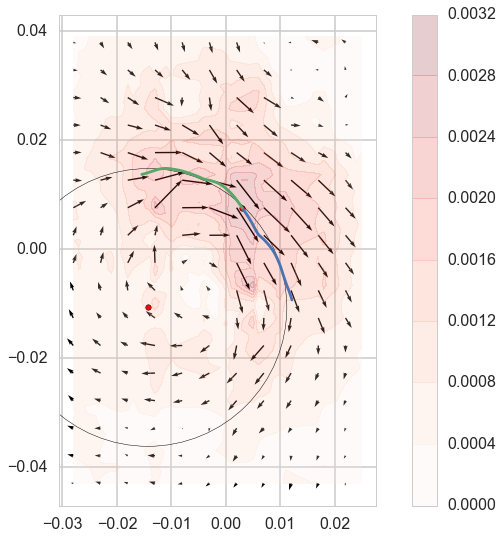

In [20]:
magnitude = np.sqrt(b_fields[0][0, :, :]**2 + b_fields[0][1, :, :]**2)
peak_index = peak_local_max(magnitude, min_distance=7)
plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()
plt.plot(sol2[:,0], sol2[:,1])
plt.plot(sol1[:,0], sol1[:,1])
plt.scatter(p1[0], p1[1], c='r', s=30)
plt.scatter(max_x, max_y, c='r', s=30)
circle = plt.Circle((p1[0], p1[1]), p1[2], fill=False)
axes = plt.gca()
axes.add_artist(circle)
axes.set_aspect('equal')

## Take a step towards the center of the circle fit and repear procedure

In [21]:
next_x_direction = p1[0] - max_x
next_y_direction = p1[1] - max_y
next_x = max_x + 0.1*next_x_direction
next_y = max_y + 0.1*next_y_direction

In [22]:
t2 = np.linspace(0, 10, 100)
t1 = np.linspace(0, -10, 100)
sol2 = odeint(d_l, [next_x, next_y], t2)
sol1 = odeint(d_l, [next_x, next_y], t1)
sol = np.concatenate((sol1, sol2))

In [23]:
p1, success = leastsq(to_min, params_guess, args=np.asarray([sol[:, 0], sol[:, 1]]))

In [24]:
p1

array([-0.01047567, -0.00858534,  0.01850292])

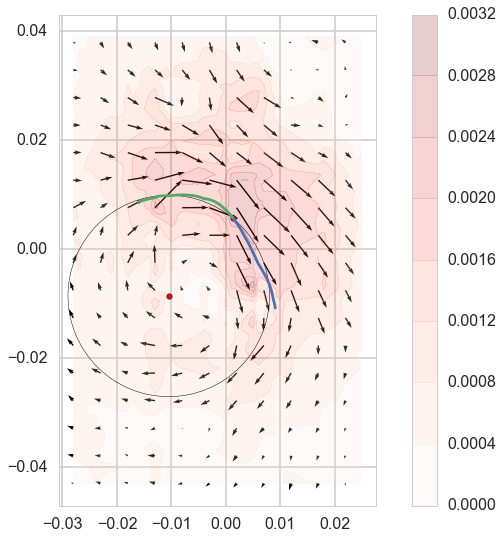

In [25]:
magnitude = np.sqrt(b_fields[0][0, :, :]**2 + b_fields[0][1, :, :]**2)
peak_index = peak_local_max(magnitude, min_distance=7)
plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()
plt.plot(sol2[:,0], sol2[:,1])
plt.plot(sol1[:,0], sol1[:,1])
plt.scatter(p1[0], p1[1], c='r', s=30)
plt.scatter(next_x, next_y, c='r', s=30)
circle = plt.Circle((p1[0], p1[1]), p1[2], fill=False)
axes = plt.gca()
axes.add_artist(circle)
axes.set_aspect('equal')

# Another step

In [26]:
next_x_direction = p1[0] - next_x
next_y_direction = p1[1] - next_y
next_x = next_x + 0.1*next_x_direction
next_y = next_y + 0.1*next_y_direction

In [27]:
t2 = np.linspace(0, 10, 100)
t1 = np.linspace(0, -10, 100)
sol2 = odeint(d_l, [next_x, next_y], t2)
sol1 = odeint(d_l, [next_x, next_y], t1)
sol = np.concatenate((sol1, sol2))

In [28]:
p1, success = leastsq(to_min, params_guess, args=np.asarray([sol[:, 0], sol[:, 1]]))
p1

array([-0.00774423, -0.00746176,  0.01368364])

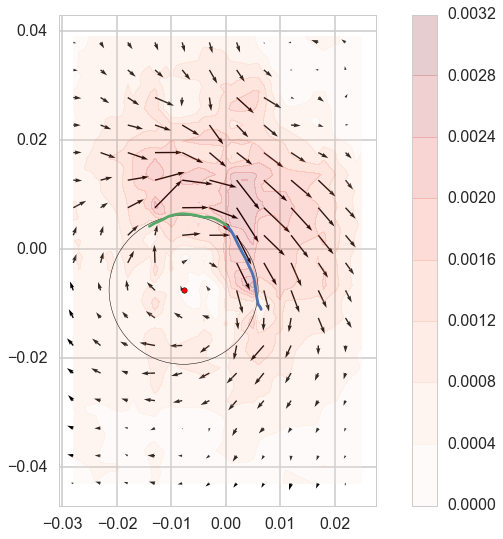

In [29]:
magnitude = np.sqrt(b_fields[0][0, :, :]**2 + b_fields[0][1, :, :]**2)
peak_index = peak_local_max(magnitude, min_distance=7)
plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()
plt.plot(sol2[:,0], sol2[:,1])
plt.plot(sol1[:,0], sol1[:,1])
plt.scatter(p1[0], p1[1], c='r', s=30)
plt.scatter(next_x, next_y, c='r', s=30)
circle = plt.Circle((p1[0], p1[1]), p1[2], fill=False)
axes = plt.gca()
axes.add_artist(circle)
axes.set_aspect('equal')

In [30]:
next_x_direction = p1[0] - next_x
next_y_direction = p1[1] - next_y
next_x = next_x + 0.1*next_x_direction
next_y = next_y + 0.1*next_y_direction

t2 = np.linspace(0, 10, 100)
t1 = np.linspace(0, -10, 100)
sol2 = odeint(d_l, [next_x, next_y], t2)
sol1 = odeint(d_l, [next_x, next_y], t1)
sol = np.concatenate((sol1, sol2))

p1, success = leastsq(to_min, params_guess, args=np.asarray([sol[:, 0], sol[:, 1]]))
p1

array([-0.00624189, -0.00753589,  0.01134752])

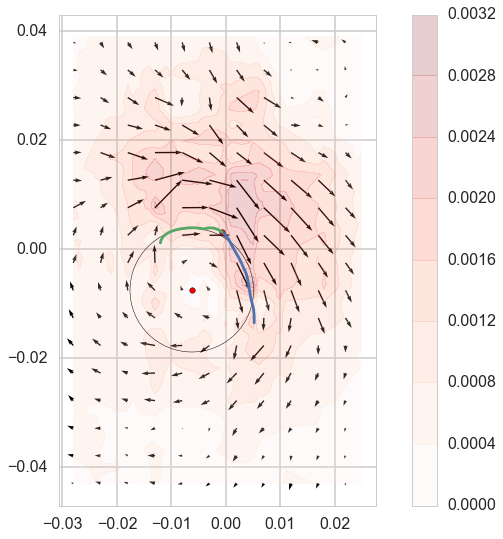

In [31]:
magnitude = np.sqrt(b_fields[0][0, :, :]**2 + b_fields[0][1, :, :]**2)
peak_index = peak_local_max(magnitude, min_distance=7)
plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()
plt.plot(sol2[:,0], sol2[:,1])
plt.plot(sol1[:,0], sol1[:,1])
plt.scatter(p1[0], p1[1], c='r', s=30)
plt.scatter(next_x, next_y, c='r', s=30)
circle = plt.Circle((p1[0], p1[1]), p1[2], fill=False)
axes = plt.gca()
axes.add_artist(circle)
axes.set_aspect('equal')

## A fairly good fit

In [32]:
next_x_direction = p1[0] - next_x
next_y_direction = p1[1] - next_y
next_x = next_x + 0.1*next_x_direction
next_y = next_y + 0.1*next_y_direction

t2 = np.linspace(0, 10, 100)
t1 = np.linspace(0, -10, 100)
sol2 = odeint(d_l, [next_x, next_y], t2)
sol1 = odeint(d_l, [next_x, next_y], t1)
sol = np.concatenate((sol1, sol2))

p1, success = leastsq(to_min, params_guess, args=np.asarray([sol[:, 0], sol[:, 1]]))
p1

array([-0.00614973, -0.00782606,  0.01051993])

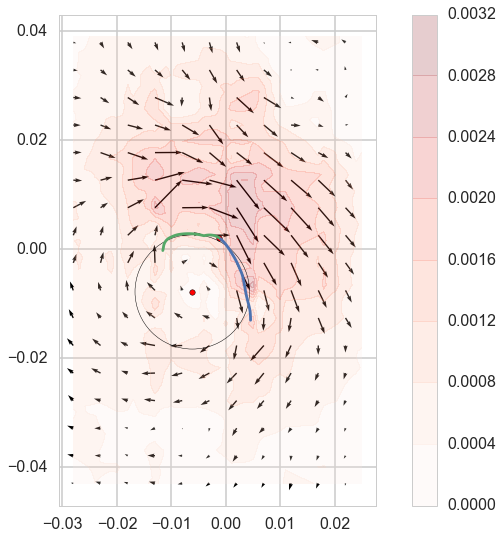

In [33]:
magnitude = np.sqrt(b_fields[0][0, :, :]**2 + b_fields[0][1, :, :]**2)
peak_index = peak_local_max(magnitude, min_distance=7)
plt.quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
           b_fields[0][0, :, :][::5, ::5], b_fields[0][1, :, :][::5, ::5])
plt.contourf(grid[0, :, :], grid[1, :, :], 
             magnitude, alpha=0.2, cmap='Reds')
cb = plt.colorbar()
plt.plot(sol2[:,0], sol2[:,1])
plt.plot(sol1[:,0], sol1[:,1])
plt.scatter(p1[0], p1[1], c='r', s=30)
plt.scatter(next_x, next_y, c='r', s=30)
circle = plt.Circle((p1[0], p1[1]), p1[2], fill=False)
axes = plt.gca()
axes.add_artist(circle)
axes.set_aspect('equal')

# Now write up the procedure as a function and test it on all 21 time steps.
# What will happen when the field line null is out of the measurement plane?

In [34]:
def d_l(l, t, interpolator_x, interpolator_y):
    return np.asarray([interpolator_x([l[0], l[1]])[0], 
                       interpolator_y([l[0], l[1]])[0]])

def find_centroid(grid, bx_interpolator, by_interpolator, 
                  distance_thres=0.001, filter_size=5,
                  integration_length=10, integration_steps=100,
                  launch_point_step_factor=0.1):
    r"""
    """
    b_fields_x = bx_interpolator(grid[0][:, :], grid[1][:, :])
    b_fields_y = by_interpolator(grid[0][:, :], grid[1][:, :])
    b_fields = [b_fields_x, b_fields_y]
    x_min, x_max = grid[0].min(), grid[0].max()
    y_min, y_max = grid[1].min(), grid[1].max()
    magnitude = np.sqrt(b_fields[0][:, :]**2 + b_fields[1][:, :]**2)
    filtered_magnitude = ndimage.gaussian_filter(magnitude, filter_size)
    max_index = np.unravel_index(filtered_magnitude.argmax(), 
                                 filtered_magnitude.shape)
    
    center_points = []
    radii = []
    center_points = []
    streamlines = []
    direction = [0, 0]
    distance = 100
    launch_point = (grid[0][max_index], grid[1][max_index])
    count = 0
    while distance >= distance_thres:
        #print 'launch', launch_point
        #print distance
        t2 = np.linspace(0, integration_length, integration_steps)
        t1 = np.linspace(0, -integration_length, integration_steps)
        stream2 = odeint(d_l, launch_point, t2, args=(bx_interpolator, by_interpolator))
        stream1 = odeint(d_l, launch_point, t1, args=(bx_interpolator, by_interpolator))
        streamline = np.concatenate((stream1, stream2))
        size = streamline[np.invert(np.isnan(streamline))].size
        streamline = streamline[np.invert(np.isnan(streamline))].reshape(int(size/2.), 2)
        
        circle_params, success = leastsq(to_min, params_guess, args=np.asarray([streamline[:, 0], streamline[:, 1]]))
        direction = [circle_params[0] - launch_point[0], circle_params[1] - launch_point[1]]
        distance = np.sqrt(direction[0]**2. + direction[1]**2.)
        center_point = (circle_params[0], circle_params[1])
        launch_point = [launch_point[0] + direction[0] * launch_point_step_factor,
                        launch_point[1] + direction[1] * launch_point_step_factor]
        center_points.append(center_point)
        #print 'center', center_point
        radii.append(circle_params[0])
        streamlines.append(streamline)
        if (launch_point[0] <= x_min or
            launch_point[0] >= x_max or
            launch_point[1] <= y_min or 
            launch_point[1] >= y_max): #or
            #count > 20):
            break
        count += 1
    centroid = center_point
    return centroid, center_points, radii, streamlines, max_index

In [35]:
bx_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_x_0000.p', 'rb'))
by_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_y_0000.p', 'rb'))

(centroid, center_points, 
 radii, streamlines, 
 max_index) = find_centroid(grid, 
                            bx_interpolator, 
                            by_interpolator)

In [36]:
centroids = []
for time_point in xrange(21):
    print time_point
    bx_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_x_' + str(time_point).zfill(4) + '.p', 'rb'))
    by_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_y_' + str(time_point).zfill(4) + '.p', 'rb'))

    (centroid, center_points, 
     radii, streamlines, 
     max_index) = find_centroid(grid, 
                                bx_interpolator, 
                                by_interpolator,
                                launch_point_step_factor=0.05,
                                integration_length=20)

    centroids.append(centroid)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


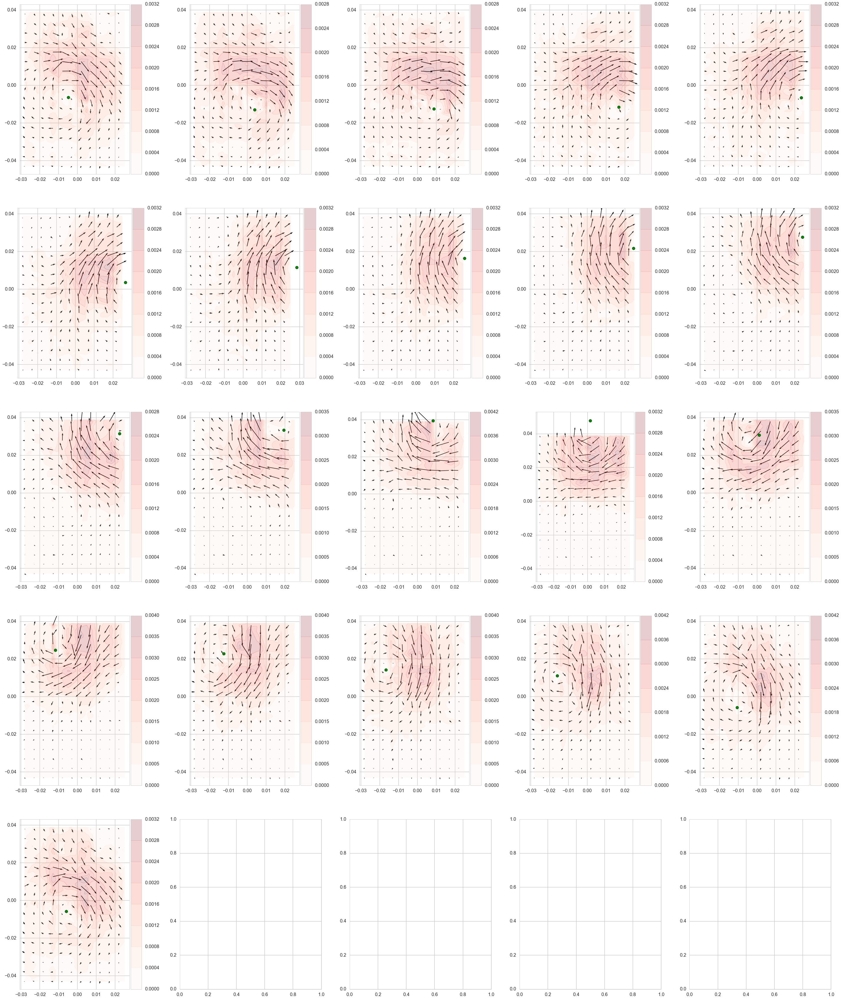

In [37]:
figure, axes = plt.subplots(5, 5, figsize=(50, 60))
for time_point in xrange(21):
    magnitude = np.sqrt(b_fields[time_point][0, :, :]**2 + b_fields[time_point][1, :, :]**2)
    axes[time_point/5][time_point%5].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
                                            b_fields[time_point][0, :, :][::5, ::5], 
                                            b_fields[time_point][1, :, :][::5, ::5]) 
    contour = axes[time_point/5][time_point%5].contourf(grid[0, :, :], grid[1, :, :], 
                                                        magnitude, alpha=0.2, cmap='Reds')
    divider = make_axes_locatable(axes[time_point/5][time_point%5])
    colorbar_axis = divider.append_axes("right", size="10%", pad=0.05)
    colorbar = plt.colorbar(contour, cax=colorbar_axis)
    axes[time_point/5][time_point%5].scatter(centroids[time_point][0], 
                                             centroids[time_point][1], c='g', s=100)
    axes[time_point/5][time_point%5].set_aspect('equal')

In [40]:
centroids = np.asarray(centroids)
np.savetxt('../output/2016-07-19/field_nulls.txt', centroids, header='magnetic field null positions in the z=0.249m plane,' + 
           'determined by fitting circles to integrated field lines starting at max magnitude and moving succesive' +
           'towards the center of circles.')

In [635]:
centroids = []
for time_point in xrange(21):
    print time_point
    bx_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_x_' + str(time_point).zfill(4) + '.p', 'rb'))
    by_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_y_' + str(time_point).zfill(4) + '.p', 'rb'))

    (centroid, center_points, 
     radii, streamlines, 
     max_index) = find_centroid(grid, 
                                bx_interpolator, 
                                by_interpolator,
                                launch_point_step_factor=0.1,
                                integration_length=20)

    centroids.append(centroid)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


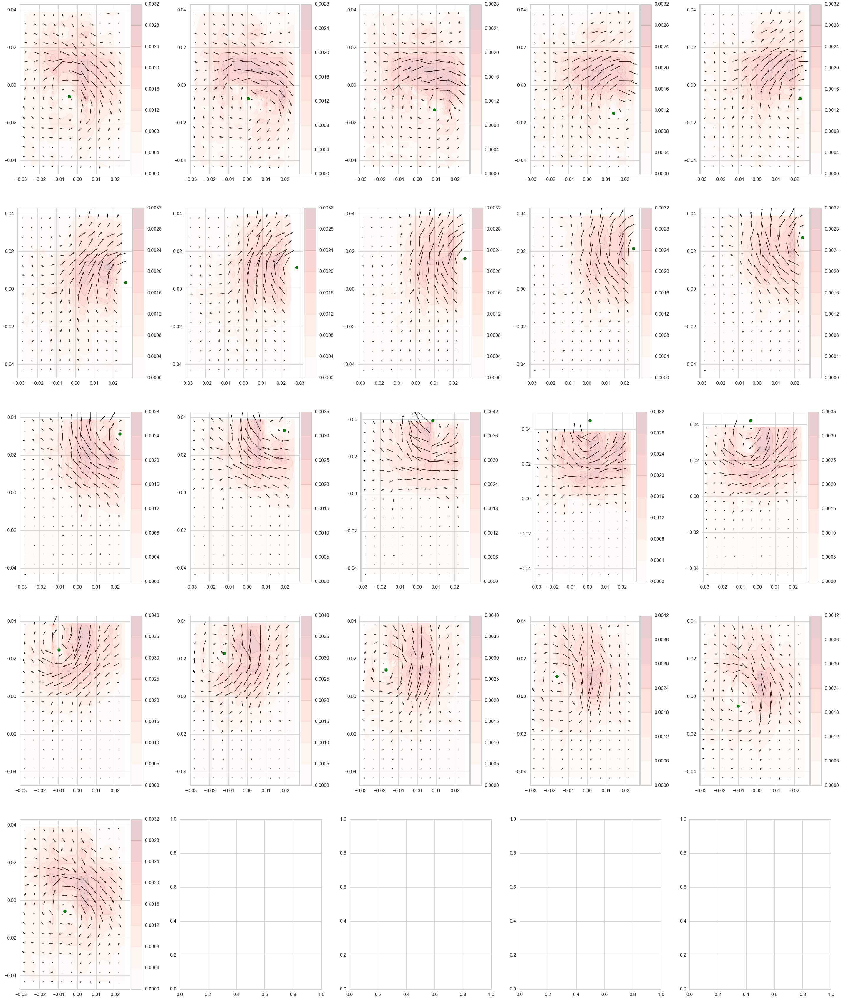

In [636]:
figure, axes = plt.subplots(5, 5, figsize=(50, 60))
for time_point in xrange(21):
    magnitude = np.sqrt(b_fields[time_point][0, :, :]**2 + b_fields[time_point][1, :, :]**2)
    axes[time_point/5][time_point%5].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
                                            b_fields[time_point][0, :, :][::5, ::5], 
                                            b_fields[time_point][1, :, :][::5, ::5]) 
    contour = axes[time_point/5][time_point%5].contourf(grid[0, :, :], grid[1, :, :], 
                                                        magnitude, alpha=0.2, cmap='Reds')
    divider = make_axes_locatable(axes[time_point/5][time_point%5])
    colorbar_axis = divider.append_axes("right", size="10%", pad=0.05)
    colorbar = plt.colorbar(contour, cax=colorbar_axis)
    axes[time_point/5][time_point%5].scatter(centroids[time_point][0], 
                                             centroids[time_point][1], c='g', s=100)
    axes[time_point/5][time_point%5].set_aspect('equal')

In [637]:
centroids = []
for time_point in xrange(21):
    print time_point
    bx_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_x_' + str(time_point).zfill(4) + '.p', 'rb'))
    by_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_y_' + str(time_point).zfill(4) + '.p', 'rb'))

    (centroid, center_points, 
     radii, streamlines, 
     max_index) = find_centroid(grid, 
                                bx_interpolator, 
                                by_interpolator,
                                launch_point_step_factor=0.1,
                                integration_length=20)

    centroids.append(centroid)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


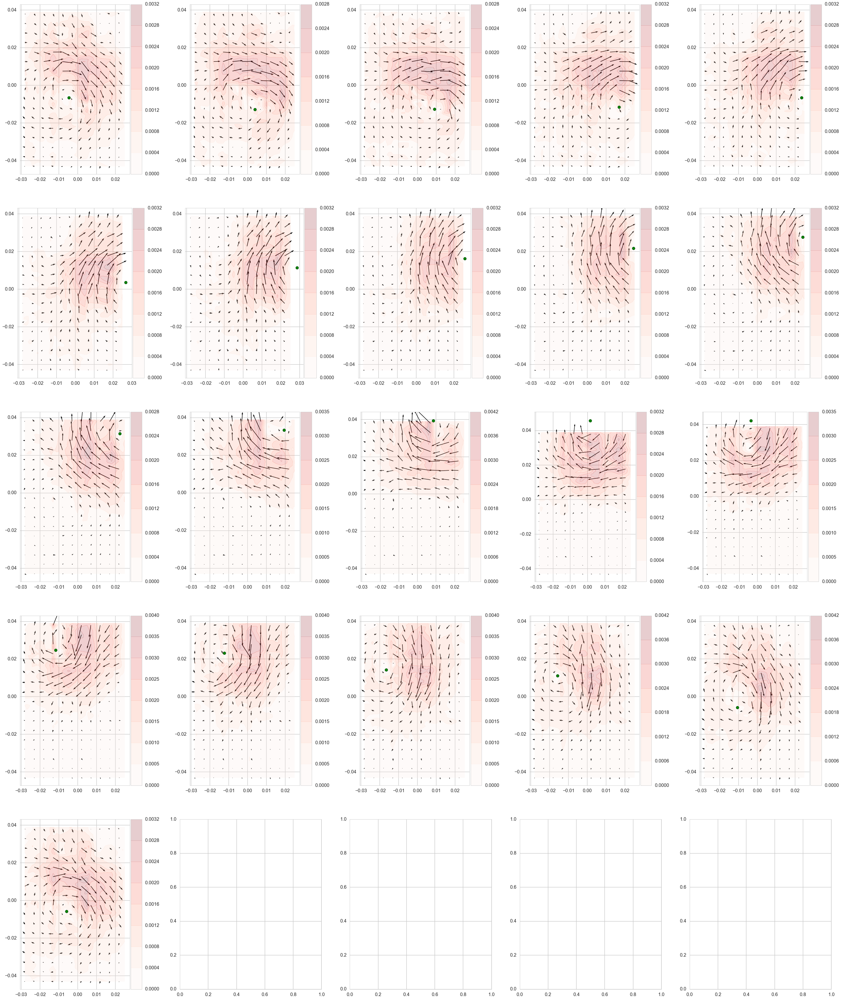

In [638]:
figure, axes = plt.subplots(5, 5, figsize=(50, 60))
for time_point in xrange(21):
    magnitude = np.sqrt(b_fields[time_point][0, :, :]**2 + b_fields[time_point][1, :, :]**2)
    axes[time_point/5][time_point%5].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
                                            b_fields[time_point][0, :, :][::5, ::5], 
                                            b_fields[time_point][1, :, :][::5, ::5]) 
    contour = axes[time_point/5][time_point%5].contourf(grid[0, :, :], grid[1, :, :], 
                                                        magnitude, alpha=0.2, cmap='Reds')
    divider = make_axes_locatable(axes[time_point/5][time_point%5])
    colorbar_axis = divider.append_axes("right", size="10%", pad=0.05)
    colorbar = plt.colorbar(contour, cax=colorbar_axis)
    axes[time_point/5][time_point%5].scatter(centroids[time_point][0], 
                                             centroids[time_point][1], c='g', s=100)
    axes[time_point/5][time_point%5].set_aspect('equal')

In [639]:
centroids = []
for time_point in xrange(21):
    print time_point
    bx_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_x_' + str(time_point).zfill(4) + '.p', 'rb'))
    by_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_y_' + str(time_point).zfill(4) + '.p', 'rb'))

    (centroid, center_points, 
     radii, streamlines, 
     max_index) = find_centroid(grid, 
                                bx_interpolator, 
                                by_interpolator,
                                launch_point_step_factor=0.01,
                                integration_length=30)

    centroids.append(centroid)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


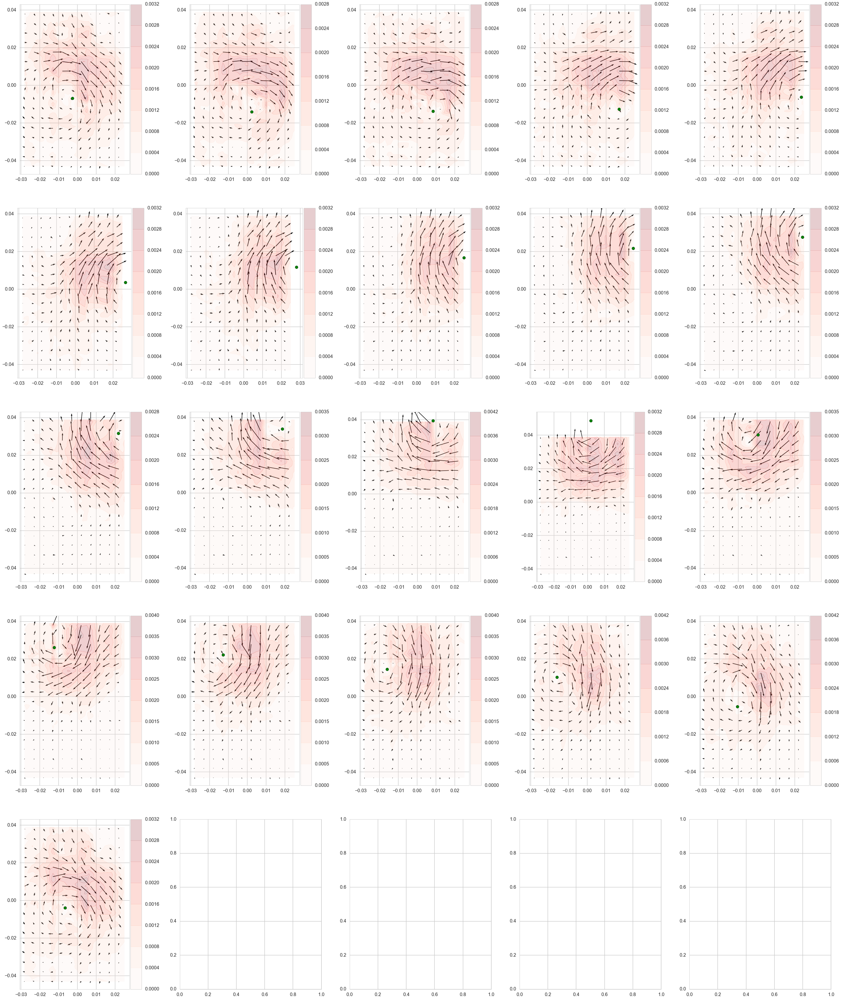

In [640]:
figure, axes = plt.subplots(5, 5, figsize=(50, 60))
for time_point in xrange(21):
    magnitude = np.sqrt(b_fields[time_point][0, :, :]**2 + b_fields[time_point][1, :, :]**2)
    axes[time_point/5][time_point%5].quiver(grid[0, :, :][::5, ::5], grid[1, :, :][::5, ::5], 
                                            b_fields[time_point][0, :, :][::5, ::5], 
                                            b_fields[time_point][1, :, :][::5, ::5]) 
    contour = axes[time_point/5][time_point%5].contourf(grid[0, :, :], grid[1, :, :], 
                                                        magnitude, alpha=0.2, cmap='Reds')
    divider = make_axes_locatable(axes[time_point/5][time_point%5])
    colorbar_axis = divider.append_axes("right", size="10%", pad=0.05)
    colorbar = plt.colorbar(contour, cax=colorbar_axis)
    axes[time_point/5][time_point%5].scatter(centroids[time_point][0], 
                                             centroids[time_point][1], c='g', s=100)
    axes[time_point/5][time_point%5].set_aspect('equal')

In [ ]:
centroids = []
for time_point in xrange(21):
    print time_point
    bx_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_x_' + str(time_point).zfill(4) + '.p', 'rb'))
    by_interpolator = pickle.load(open('../output/2016-07-03/B_z0249_y_' + str(time_point).zfill(4) + '.p', 'rb'))

    (centroid, center_points, 
     radii, streamlines, 
     max_index) = find_centroid(grid, 
                                bx_interpolator, 
                                by_interpolator,
                                launch_point_step_factor=0.001,
                                integration_length=30,
                                distance_thres=0.0001)

    centroids.append(centroid)

0
1
2
3
4
5
6
7
8
